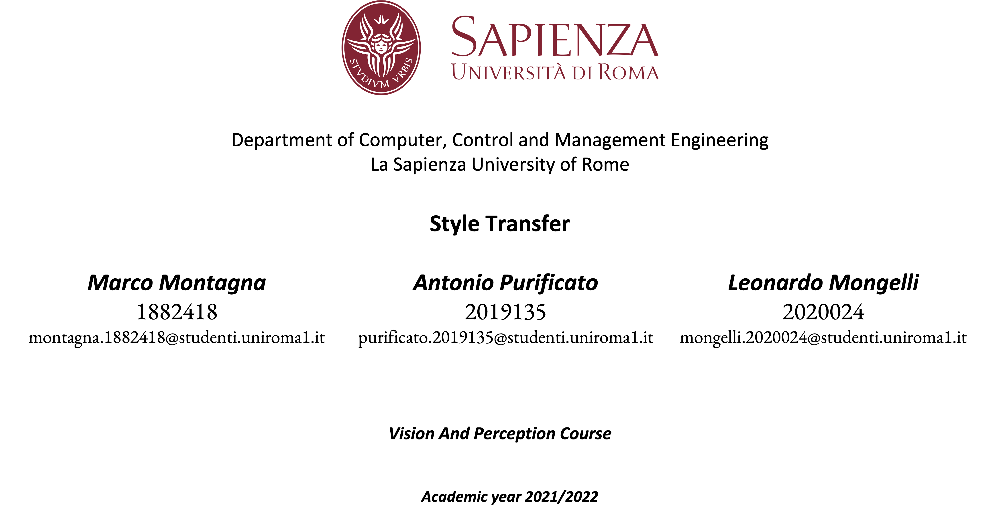

In [1]:
# Mount Google Drive
from google.colab import drive  # import drive from google colab

ROOT = "/content/drive"  # default location for the drive

drive.mount(ROOT)  # we mount the google drive at /content/drive

Mounted at /content/drive


##Setup
⚠️ The first time run this cell, then comment **ONLY** it. ⚠️

In [ ]:
%%capture
!pip install -U --no-cache-dir gdown --pre
%cd /content/drive/MyDrive
!mkdir StyleTransfer
%cd StyleTransfer
!mkdir models
!mkdir data
!mkdir tb_logs
%cd data
!gdown --no-cookies --id 1u9MQ3IsUJ3uc9CfbG43Kyrpmoo_viMta
!unzip Faces.zip
!rm -rf Faces.zip
!gdown --no-cookies --id 1pES5_mvsddKN4VfvZNG5Nd7zUhn0XRLd
!unzip Panorama.zip
!rm -rf Panorama.zip
!gdown --no-cookies --id 13cfqXP6zLAZZcoDH1ITNgeG2mnt-Qzco
!unzip trainA.zip
!rm -rf trainA.zip
!gdown --no-cookies --id 1S6g-XD0rJoZluiBMbtDbXouy00bixvu5
!unzip testFaces.zip
!rm -rf testFaces.zip
!gdown --no-cookies --id 1fHVg4ZvRa0oRyqXISoKHmKKauQHRaSLd
!unzip testPanoramas.zip
!rm -rf testPanoramas.zip
!gdown --no-cookies --id 1WRkGaan9CLmqIRoiMWc3OzghuJjbAE2H
!unzip vanGoghFaces.zip
!rm -rf vanGoghFaces.zip

%cd ../models
!gdown --no-cookies --id 10X1jo1VN8AHfTdAgwg9N1bza7bgpPOBN
!unzip model_panoramas_200.zip
!rm -rf model_panoramas_200.zip
!gdown --no-cookies --id 1vRU6rk_Nnmo9rsuMBGSu1kjCRvMoJe82
!unzip model_faces_200.zip
!rm -rf model_faces_200.zip

!gdown --no-cookies --id 1UnXIgxcGqBbBSuVw_nH4VNjYZXvVZiYB
!unzip neuralModel.ckpt.zip
!rm -rf neuralModel.ckpt.zip
!gdown --no-cookies --id 1sZhQgnOAor-HMBIoZxrHeLdh-t87ZPNA
!unzip neuralModelGray.ckpt.zip
!rm -rf neuralModelGray.ckpt.zip

%cd ..

In [2]:
%cd ./drive/MyDrive/StyleTransfer

/content/drive/MyDrive/StyleTransfer


In [3]:
%%capture
!pip install "torchmetrics"

In [4]:
%matplotlib inline
import os, glob, random
import numpy as np
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import shutil
from tqdm.notebook import tqdm_notebook

import torch
from torch import nn, optim
from torch.optim.lr_scheduler import CosineAnnealingLR
from torch.utils.data import DataLoader, Dataset
from torch.utils.tensorboard import SummaryWriter

from torchvision.utils import make_grid
from torchvision import transforms
from torchvision import transforms as T
from torchvision.models import vgg16

from torchsummary import summary

from torchmetrics import functional

In [5]:
torch.manual_seed(21)
device = "cuda" if torch.cuda.is_available() else "cpu"

layout = {
    "Layout 1": {"loss": ["Multiline", ["loss/Generator", "loss/Discriminator"]]},
}

writer = SummaryWriter("tb_logs")
writer.add_custom_scalars(layout)

In [7]:
faces = "data/Faces/*.jpg"
paintings = "data/trainA/*.jpg"
test_faces = "data/testFaces/*.jpg"
panoramas = "data/Panorama/*.jpg"
test_panoramas = "data/testPanoramas/*.jpg"
faces_paintings = "data/vanGoghFaces/*.jpg"

# CycleGan

##Data processing
A different transformation is applied for training data and test data.

In [8]:
class ImageTransform:
    def __init__(self, img_size=256):
        self.transform = {
            "train": transforms.Compose(
                [
                    transforms.Resize((img_size, img_size)),
                    transforms.RandomHorizontalFlip(),
                    transforms.RandomVerticalFlip(),
                    transforms.ToTensor(),
                    transforms.Normalize(mean=[0.5], std=[0.5]),
                ]
            ),
            "test": transforms.Compose(
                [
                    transforms.Resize((img_size, img_size)),
                    transforms.ToTensor(),
                    transforms.Normalize(mean=[0.5], std=[0.5]),
                ]
            ),
        }

    def __call__(self, img, data_type="train"):
        img = self.transform[data_type](img)

        return img

##Dataset definition

In [13]:
class VanGoghDataset(Dataset):
    def __init__(
        self, transform, task_type="faces", data_type="train", data_dir="data"
    ):
        super(VanGoghDataset, self).__init__()
        self.data_dir = "data"
        self.transform = transform
        self.data_type = data_type

        if self.data_type == "train":
            if task_type == "faces":
                self.humans_path = random.sample(glob.glob(faces), 100)
                self.paintings_path = glob.glob(faces_paintings)
            else:
                self.humans_path = random.sample(glob.glob(panoramas), 100)
                self.paintings_path = glob.glob(paintings)
        if self.data_type == "test":
            if task_type == "faces":
                self.humans_path = glob.glob(test_faces)
                self.paintings_path = glob.glob(faces_paintings)
            else:
                self.humans_path = glob.glob(test_panoramas)
                self.paintings_path = glob.glob(paintings)
        
        random.shuffle(self.humans_path)
        random.shuffle(self.paintings_path)

    def __len__(self):
        return min([len(self.humans_path), len(self.paintings_path)])

    def __getitem__(self, idx):
        human_img_path = self.humans_path[idx]
        painting_img_path = self.paintings_path[idx]
        human_img = Image.open(human_img_path).convert("RGB")
        painting_img = Image.open(painting_img_path).convert("RGB")

        human_img = self.transform(human_img, self.data_type)
        painting_img = self.transform(painting_img, self.data_type)

        return human_img, painting_img

##Dataset creation

###Faces

In [14]:
faces_dataset = VanGoghDataset(ImageTransform(), data_type="test")
faces_dataloader = DataLoader(
    faces_dataset, batch_size=8, shuffle=True, pin_memory=True
)
faces_base, faces_style = next(iter(faces_dataloader))

###Panoramas

In [15]:
panoramas_dataset = VanGoghDataset(
    ImageTransform(), data_type="test", task_type="panoramas"
)
panoramas_dataloader = DataLoader(
    panoramas_dataset, batch_size=8, shuffle=True, pin_memory=True
)
panoramas_base, panoramas_style = next(iter(panoramas_dataloader))

##Pictures from the datasets

###Faces

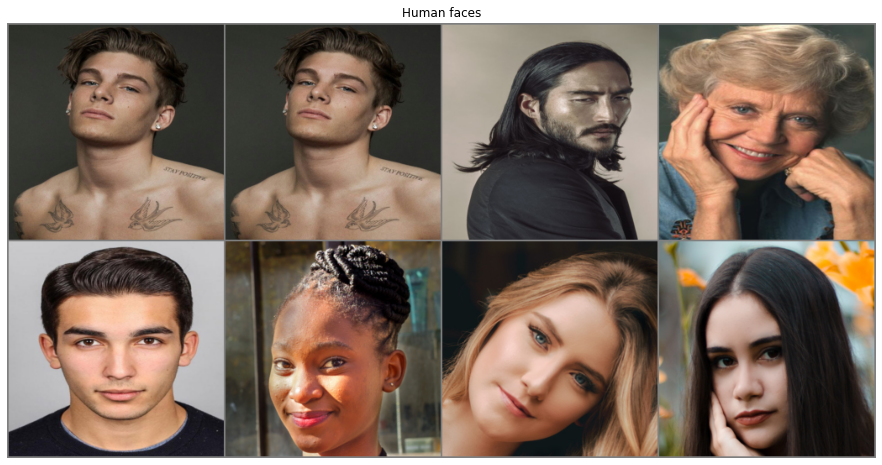

In [16]:
output_image = (
    make_grid(faces_base, nrow=4, padding=2).permute(1, 2, 0).detach().numpy()
)
output_image = output_image * 0.5 + 0.5
output_image = output_image * 255.0
output_image = output_image.astype(int)

fig = plt.figure(figsize=(18, 8), facecolor="w")
plt.imshow(output_image)
plt.axis("off")
plt.title("Human faces")
plt.show()

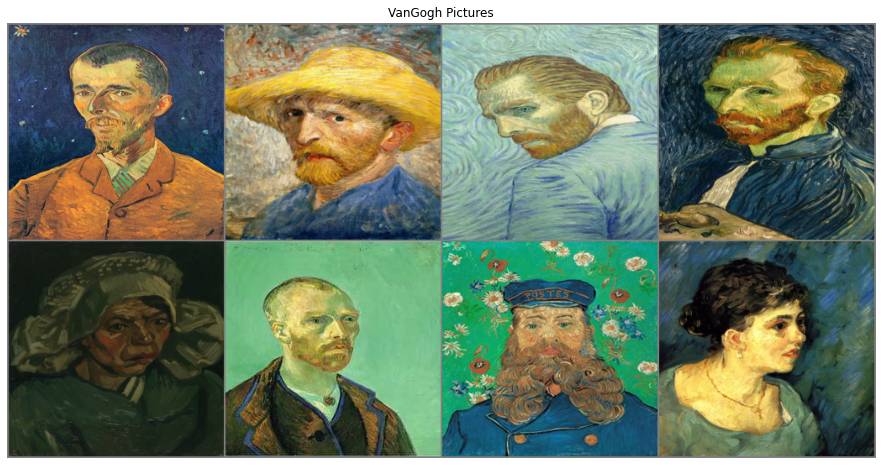

In [17]:
output_image = (
    make_grid(faces_style, nrow=4, padding=2).permute(1, 2, 0).detach().numpy()
)
output_image = output_image * 0.5 + 0.5
output_image = output_image * 255.0
output_image = output_image.astype(int)

fig = plt.figure(figsize=(18, 8), facecolor="w")
plt.imshow(output_image)
plt.axis("off")
plt.title("VanGogh Pictures")
plt.show()

###Panoramas

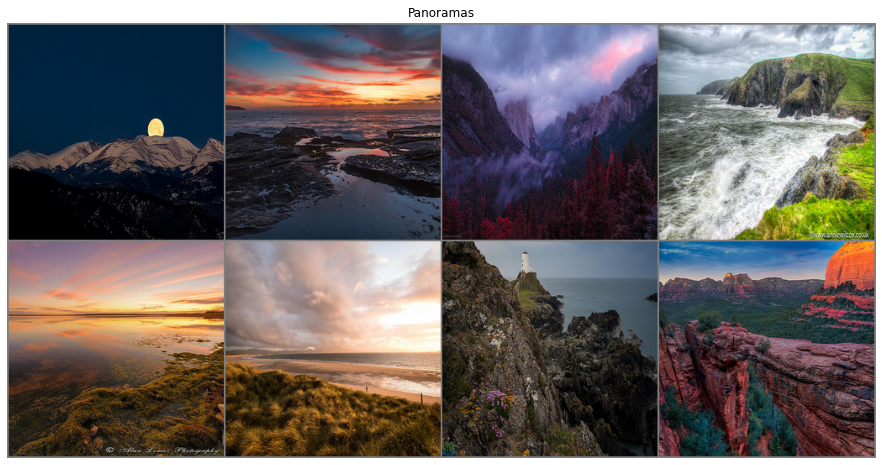

In [18]:
output_image = (
    make_grid(panoramas_base, nrow=4, padding=2).permute(1, 2, 0).detach().numpy()
)
output_image = output_image * 0.5 + 0.5
output_image = output_image * 255.0
output_image = output_image.astype(int)

fig = plt.figure(figsize=(18, 8), facecolor="w")
plt.imshow(output_image)
plt.axis("off")
plt.title("Panoramas")
plt.show()

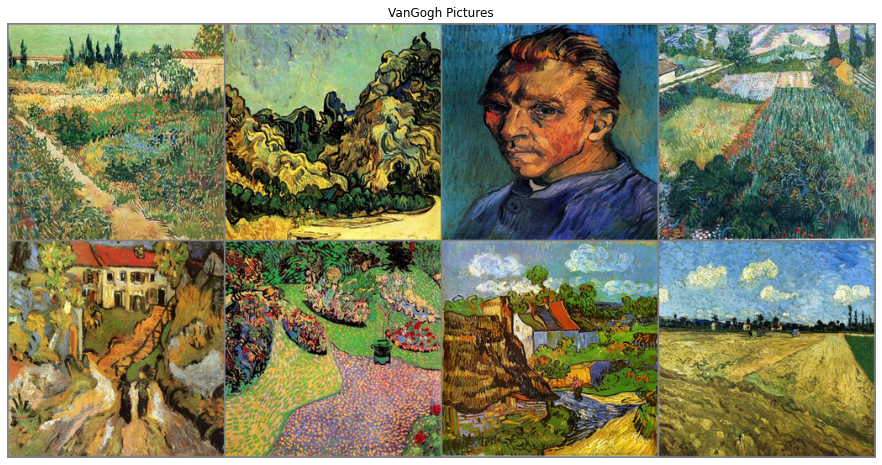

In [20]:
output_image = (
    make_grid(panoramas_style, nrow=4, padding=2).permute(1, 2, 0).detach().numpy()
)
output_image = output_image * 0.5 + 0.5
output_image = output_image * 255.0
output_image = output_image.astype(int)

fig = plt.figure(figsize=(18, 8), facecolor="w")
plt.imshow(output_image)
plt.axis("off")
plt.title("VanGogh Pictures")
plt.show()

##Upsampling and downsampling blocks

In [21]:
class Upsample(nn.Module):
    def __init__(
        self,
        in_channels,
        out_channels,
        kernel_size=4,
        stride=2,
        padding=1,
        dropout=True,
    ):
        super(Upsample, self).__init__()
        self.dropout = dropout
        self.block = nn.Sequential(
            nn.ConvTranspose2d(
                in_channels,
                out_channels,
                kernel_size,
                stride,
                padding,
                bias=nn.InstanceNorm2d,
            ),
            nn.InstanceNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )
        self.dropout_layer = nn.Dropout2d(0.5)

    def forward(self, x, shortcut=None):
        x = self.block(x)
        if self.dropout:
            x = self.dropout_layer(x)

        if shortcut is not None:
            x = torch.cat([x, shortcut], dim=1)

        return x


class Downsample(nn.Module):
    def __init__(
        self,
        in_channels,
        out_channels,
        kernel_size=4,
        stride=2,
        padding=1,
        apply_instancenorm=True,
    ):
        super(Downsample, self).__init__()
        self.conv = nn.Conv2d(
            in_channels,
            out_channels,
            kernel_size,
            stride,
            padding,
            bias=nn.InstanceNorm2d,
        )
        self.norm = nn.InstanceNorm2d(out_channels)
        self.relu = nn.LeakyReLU(0.2, inplace=True)
        self.apply_norm = apply_instancenorm

    def forward(self, x):
        x = self.conv(x)
        if self.apply_norm:
            x = self.norm(x)
        x = self.relu(x)

        return x

##Generator

In [22]:
class Generator(nn.Module):
    def __init__(self, filter=64):
        super(Generator, self).__init__()
        self.downsamples = nn.ModuleList(
            [
                Downsample(
                    3, filter, kernel_size=4, apply_instancenorm=False
                ),  
                Downsample(filter, filter * 2),  
                Downsample(filter * 2, filter * 4),  
                Downsample(filter * 4, filter * 8),  
                Downsample(filter * 8, filter * 8),  
                Downsample(filter * 8, filter * 8),  
                Downsample(filter * 8, filter * 8),  
            ]
        )

        self.upsamples = nn.ModuleList(
            [
                Upsample(filter * 8, filter * 8),
                Upsample(filter * 16, filter * 8),
                Upsample(filter * 16, filter * 8),
                Upsample(filter * 16, filter * 4, dropout=False),
                Upsample(filter * 8, filter * 2, dropout=False),
                Upsample(filter * 4, filter, dropout=False),
            ]
        )

        self.last = nn.Sequential(
            nn.ConvTranspose2d(filter * 2, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh(),
        )

    def forward(self, x):
        skips = []
        for l in self.downsamples:
            x = l(x)
            skips.append(x)

        skips = reversed(skips[:-1])
        for l, s in zip(self.upsamples, skips):
            x = l(x, s)

        out = self.last(x)

        return out

In [23]:
class Discriminator(nn.Module):
    def __init__(self, filter=64):
        super(Discriminator, self).__init__()

        self.block = nn.Sequential(
            Downsample(3, filter, kernel_size=4, stride=2, apply_instancenorm=False),
            Downsample(filter, filter * 2, kernel_size=4, stride=2),
            Downsample(filter * 2, filter * 4, kernel_size=4, stride=2),
            Downsample(filter * 4, filter * 8, kernel_size=4, stride=1),
        )

        self.last = nn.Conv2d(filter * 8, 1, kernel_size=4, stride=1, padding=1)

    def forward(self, x):
        x = self.block(x)
        x = self.last(x)

        return x

##Weights inizialization

In [24]:
def init_weights(net, init_type="normal", init_gain=0.02):
    def init_func(m):
        classname = m.__class__.__name__
        if hasattr(m, "weight") and (
            classname.find("Conv") != -1 or classname.find("Linear") != -1
        ):
            if init_type == "normal":
                nn.init.normal_(m.weight.data, 0.0, init_gain)
            elif init_type == "xavier":
                nn.init.xavier_normal_(m.weight.data, gain=init_gain)
            elif init_type == "kaiming":
                nn.init.kaiming_normal_(m.weight.data, a=0, mode="fan_in")
            elif init_type == "orthogonal":
                nn.init.orthogonal_(m.weight.data, gain=init_gain)
            else:
                raise NotImplementedError(
                    "initialization method [%s] is not implemented" % init_type
                )
            if hasattr(m, "bias") and m.bias is not None:
                nn.init.constant_(m.bias.data, 0.0)
        elif classname.find("BatchNorm2d") != -1:
            nn.init.normal_(m.weight.data, 1.0, init_gain)
            nn.init.constant_(m.bias.data, 0.0)

    net.apply(init_func)

##GAN definition

In [25]:
class CycleGAN(nn.Module):
    def __init__(
        self,
        G_basestyle,
        G_stylebase,
        D_base,
        D_style,
        lr,
        transform,
        reconstr_w=10,
        id_w=2,
    ):
        super(CycleGAN, self).__init__()
        self.reconstr_w = reconstr_w
        self.G_basestyle = G_basestyle
        self.D_base = D_base
        self.G_stylebase = G_stylebase
        self.D_style = D_style

        self.lr = lr
        self.id_w = id_w
        self.transform = transform
        self.opt = self.configure_optimizers()
        self.l1_loss = nn.L1Loss()
        self.generator_loss = nn.MSELoss()
        self.discriminator_loss = nn.MSELoss()
        self.G_mean_losses = []
        self.D_mean_losses = []

    def configure_optimizers(self):
        self.g_basestyle_optimizer = optim.Adam(
            self.G_basestyle.parameters(), lr=self.lr["G"], betas=(0.5, 0.999)
        )
        self.g_stylebase_optimizer = optim.Adam(
            self.G_stylebase.parameters(), lr=self.lr["G"], betas=(0.5, 0.999)
        )
        self.d_base_optimizer = optim.Adam(
            self.D_base.parameters(), lr=self.lr["D"], betas=(0.5, 0.999)
        )
        self.d_style_optimizer = optim.Adam(
            self.D_style.parameters(), lr=self.lr["D"], betas=(0.5, 0.999)
        )

        return [
            self.g_basestyle_optimizer,
            self.g_stylebase_optimizer,
            self.d_base_optimizer,
            self.d_style_optimizer,
        ]

    def fit(self, epochs, dataloader, input=0):
        self.dataloader = dataloader
        t0 = datetime.now()
        for epoch in tqdm_notebook(range(epochs)):
            model.train()
            train_loss = 0.0
            counter = 0
            if epoch % 10 == 0:
                model.display_output(data_type="train", epoch=epoch)
            for index, batch in tqdm_notebook(enumerate(dataloader)):
                x, y = batch
                x = x.to(device)
                y = y.to(device)
                for opt_index in range(4):
                    loss = model.training_step([x, y], counter, opt_index, epoch)
                    train_loss += loss["loss"].item()
                counter += 1

            train_loss = train_loss / counter
        elapsed_time = datetime.now() - t0
        torch.save(model.state_dict(), "models/model_faces_" + str(input))
        print("Training time: " + str(elapsed_time))
        return None

    def training_step(self, batch, batch_idx, optimizer_idx, epoch):

        human_img, painting_img = batch
        b = human_img.size()[0]

        valid = torch.ones(b, 1, 30, 30).cuda()
        fake = torch.zeros(b, 1, 30, 30).cuda()

        if optimizer_idx == 0 or optimizer_idx == 1:

            self.G_stylebase.train()
            self.G_basestyle.train()

            self.opt[optimizer_idx].zero_grad()

            val_base = self.generator_loss(
                self.D_base(self.G_stylebase(painting_img)), valid
            )
            val_style = self.generator_loss(
                self.D_style(self.G_basestyle(human_img)), valid
            )
            val_loss = (val_base + val_style) / 2

            reconstr_base = self.l1_loss(
                self.G_stylebase(self.G_basestyle(human_img)), human_img
            )
            reconstr_style = self.l1_loss(
                self.G_basestyle(self.G_stylebase(painting_img)), painting_img
            )
            reconstr_loss = (reconstr_base + reconstr_style) / 2

            id_base = self.l1_loss(self.G_stylebase(human_img), human_img)
            id_style = self.l1_loss(self.G_basestyle(painting_img), painting_img)
            id_loss = (id_base + id_style) / 2

            G_loss = val_loss + self.reconstr_w * reconstr_loss + self.id_w * id_loss

            self.G_mean_losses.append(G_loss.item())

            writer.add_scalar("loss/Generator", G_loss.item(), epoch)

            G_loss.backward()
            self.opt[optimizer_idx].step()

            return {"loss": G_loss}

        elif optimizer_idx == 2 or optimizer_idx == 3:

            self.opt[optimizer_idx].zero_grad()

            D_base_gen_loss = self.discriminator_loss(
                self.D_base(self.G_stylebase(painting_img)), fake
            )
            D_style_gen_loss = self.discriminator_loss(
                self.D_style(self.G_basestyle(human_img)), fake
            )
            D_base_valid_loss = self.discriminator_loss(self.D_base(human_img), valid)
            D_style_valid_loss = self.discriminator_loss(
                self.D_style(painting_img), valid
            )

            D_gen_loss = (D_base_gen_loss + D_style_gen_loss) / 2

            D_loss = (D_gen_loss + D_base_valid_loss + D_style_valid_loss) / 3

            self.D_mean_losses.append(D_loss.item())

            writer.add_scalar("loss/Discriminator", D_loss.item(), epoch)

            D_loss.backward()
            self.opt[optimizer_idx].step()

            return {"loss": D_loss}

    def display_output(self, epoch=-1, idx=0, data_type="test", task_type="faces"):
        # Display Model Output
        if data_type == "test":
            if task_type == "faces":
                target_img_paths = glob.glob(test_faces)[idx : idx + 4]
            if task_type == "panoramas":
                target_img_paths = glob.glob(test_panoramas)[idx : idx + 4]
        if data_type == "train":
            if task_type == "faces":
                target_img_paths = glob.glob(faces)[idx : idx + 4]
            if task_type == "panoramas":
                target_img_paths = glob.glob(panoramas)[idx : idx + 4]

        target_imgs = [
            self.transform(Image.open(path), data_type="test")
            for path in target_img_paths
        ]
        target_imgs = torch.stack(target_imgs, dim=0)
        target_imgs = target_imgs.cuda()

        gen_imgs = self.G_basestyle(target_imgs)
        gen_img = torch.cat([target_imgs, gen_imgs], dim=0)

        # Reverse Normalization
        gen_img = gen_img * 0.5 + 0.5
        gen_img = gen_img * 255

        joined_images_tensor = make_grid(gen_img, nrow=4, padding=2)

        joined_images = joined_images_tensor.detach().cpu().numpy().astype(int)
        joined_images = np.transpose(joined_images, [1, 2, 0])

        # Visualize
        fig = plt.figure(figsize=(18, 8))
        plt.imshow(joined_images)
        plt.axis("off")
        if epoch != -1:
            plt.title(f"Epoch {epoch}")
        else:
            plt.title("Output")
        plt.show()
        plt.clf()
        plt.close()

        return None

In [26]:
lr = {"G": 0.0002, "D": 0.0002}
reconstr_w = 8
id_w = 1

G_basestyle = Generator()
G_stylebase = Generator()
D_base = Discriminator()
D_style = Discriminator()

for net in [G_basestyle, G_stylebase, D_base, D_style]:
    init_weights(net, init_type="normal")

model = CycleGAN(
    G_basestyle, G_stylebase, D_base, D_style, lr, ImageTransform(), reconstr_w, id_w
).to(device)

##Model loading
In this notebook pre-trained architectures are used, this way the notebook is neater and there are no problems of computational resources. Below you can look at the notebooks used for training the networks:<br>
* Notebook Faces  
<a href="https://drive.google.com/file/d/1BNRCMZaqVdx2KNLj49WJnK-7F1Z-cGtW/view?usp=sharing" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Notebook Faces"/></a>
* Notebook Panoramas<br>
<a href="https://drive.google.com/file/d/1tSCBHkDqHfsBod2Ds79BbZWCZ_OLw5bd/view?usp=sharing" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Notebook Panoramas"/></a>

###Faces model loading

In [27]:
model_faces = CycleGAN(
    G_basestyle, G_stylebase, D_base, D_style, lr, ImageTransform(), reconstr_w, id_w
).to(device)
model_faces.load_state_dict(torch.load("./models/model_faces_200"))

<All keys matched successfully>

###Panoramas model loading

In [28]:
model_panoramas = CycleGAN(
    G_basestyle, G_stylebase, D_base, D_style, lr, ImageTransform(), reconstr_w, id_w
).to(device)
model_panoramas.load_state_dict(torch.load("./models/model_panoramas_200"))

<All keys matched successfully>

# NeuralModel

## Dataset creation

In [ ]:
class myDataStyle(torch.utils.data.Dataset):
    def __init__(self):
        self.image_names = glob.glob("data/Faces/*.jpg")
        self.transform = T.Compose(
            [
                T.Resize(256),
                T.CenterCrop(224),
                T.ToTensor(),
                T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
            ]
        )
        self.style = self.transform(
            Image.open("data/trainA/neuralStyleReference.jpg").convert("RGB")
        )

    def __getitem__(self, index):
        image = Image.open(self.image_names[index]).convert("RGB")
        return self.transform(image), self.style

    def __len__(self):
        return len(self.image_names)

In [ ]:
dataset = myDataStyle()
dataloader = DataLoader(dataset, batch_size=8, shuffle=True)

In [ ]:
for i, batch in enumerate(dataset):
    print(batch[0].shape)
    print(batch[1].shape)
    break

torch.Size([3, 224, 224])
torch.Size([3, 224, 224])


## Model definition

###Utility

In [ ]:
def gramm_matrix(phi):
    (b, ch, h, w) = phi.shape
    phi = torch.reshape(phi, (b, ch, h * w))
    phi_T = torch.transpose(phi, 1, 2)
    G = torch.bmm(phi, phi_T) / (ch * h * w)
    return G


invTrans = T.Compose(
    [
        T.Normalize(mean=[0.0, 0.0, 0.0], std=[1 / 0.229, 1 / 0.224, 1 / 0.225]),
        T.Normalize(mean=[-0.485, -0.456, -0.406], std=[1.0, 1.0, 1.0]),
    ]
)

In [ ]:
class ConvLayer(torch.nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride):
        super(ConvLayer, self).__init__()
        reflection_padding = kernel_size // 2
        self.reflection_pad = torch.nn.ReflectionPad2d(reflection_padding)
        self.conv2d = torch.nn.Conv2d(in_channels, out_channels, kernel_size, stride)

    def forward(self, x):
        out = self.reflection_pad(x)
        out = self.conv2d(out)
        return out


class ResidualBlock(torch.nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.conv1 = ConvLayer(channels, channels, kernel_size=3, stride=1)
        self.in1 = torch.nn.InstanceNorm2d(channels, affine=True)
        self.conv2 = ConvLayer(channels, channels, kernel_size=3, stride=1)
        self.in2 = torch.nn.InstanceNorm2d(channels, affine=True)
        self.relu = torch.nn.ReLU()

    def forward(self, x):
        residual = x
        out = self.relu(self.in1(self.conv1(x)))
        out = self.in2(self.conv2(out))
        out = out + residual
        return out


class UpsampleConvLayer(torch.nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride, upsample=None):
        super(UpsampleConvLayer, self).__init__()
        self.upsample = upsample
        reflection_padding = kernel_size // 2
        self.reflection_pad = torch.nn.ReflectionPad2d(reflection_padding)
        self.conv2d = torch.nn.Conv2d(in_channels, out_channels, kernel_size, stride)

    def forward(self, x):
        x_in = x
        if self.upsample:
            x_in = torch.nn.functional.interpolate(
                x_in, mode="nearest", scale_factor=self.upsample
            )
        out = self.reflection_pad(x_in)
        out = self.conv2d(out)
        return out


class TransformationNet(torch.nn.Module):
    def __init__(self):
        super(TransformationNet, self).__init__()
        # initial downsampling
        self.conv1 = ConvLayer(3, 32, kernel_size=9, stride=1)
        self.in1 = torch.nn.InstanceNorm2d(32, affine=True)
        self.conv2 = ConvLayer(32, 64, kernel_size=3, stride=2)
        self.in2 = torch.nn.InstanceNorm2d(64, affine=True)
        self.conv3 = ConvLayer(64, 128, kernel_size=3, stride=2)
        self.in3 = torch.nn.InstanceNorm2d(128, affine=True)
        # residual layers
        self.res1 = ResidualBlock(128)
        self.res2 = ResidualBlock(128)
        self.res3 = ResidualBlock(128)
        self.res4 = ResidualBlock(128)
        self.res5 = ResidualBlock(128)
        # final upsampling
        self.upsample1 = UpsampleConvLayer(128, 64, kernel_size=3, stride=1, upsample=2)
        self.in4 = torch.nn.InstanceNorm2d(64, affine=True)
        self.upsample2 = UpsampleConvLayer(64, 32, kernel_size=3, stride=1, upsample=2)
        self.in5 = torch.nn.InstanceNorm2d(32, affine=True)
        self.upsample3 = ConvLayer(32, 3, kernel_size=9, stride=1)
        # activation function
        self.relu = torch.nn.ReLU()
        # loss function
        self.loss_func = torch.nn.MSELoss()

    def forward(self, x):
        out = self.relu(self.in1(self.conv1(x)))
        out = self.relu(self.in2(self.conv2(out)))
        out = self.relu(self.in3(self.conv3(out)))
        out = self.res1(out)
        out = self.res2(out)
        out = self.res3(out)
        out = self.res4(out)
        out = self.res5(out)
        out = self.relu(self.in4(self.upsample1(out)))
        out = self.relu(self.in5(self.upsample2(out)))
        out = self.upsample3(out)
        return out

    def training_step(self, batch, batch_idx):
        xb = batch
        yb = xb
        pred = model(xb)
        loss = self.loss_func(pred, yb)
        return pred, loss

    def validation_step(self, batch, batch_idx):
        xb = batch
        yb = xb
        pred = model(xb)
        loss = self.loss_func(pred, yb)
        return pred, loss

    def configure_optimizers(self):
        # return optimizer
        optimizer = torch.optim.SGD(self.parameters(), lr=0.003, momentum=0.9)
        return optimizer

### Model

In [ ]:
class StyleTransferNet(nn.Module):
    def __init__(self, device="cpu"):
        super(StyleTransferNet, self).__init__()

        self.transform_net = TransformationNet()
        self.transform_net.to(device)
        self.feature_extractor_list = list(vgg16(pretrained=True).features)[:23]
        # freeze feature extractor
        for layer in self.feature_extractor_list:
            layer.requires_grad = False
            layer.to(device)
        # loss function
        self.lstyle_weight = [0.5 / n**2 for n in [0.9 * 128, 256, 2 * 512, 2 * 512]]
        self.lfeatures_weight = 2
        self.mse = nn.MSELoss()

    def forward(self, x):
        out = self.transform_net(x)
        return out

    def get_loss(self, output, original, style):
        features_out = self.get_features(output, {3, 8, 15, 22})
        features_original = self.get_features(original, {15})
        features_style = self.get_features(style, {3, 8, 15, 22})
        (dim_b, dim_ch, dim_h, dim_w) = features_out[1].shape
        f_loss = self.mse(features_out[2], features_original[0]) / (
            dim_ch * dim_h * dim_w
        )
        s_loss1 = self.lstyle_weight[0] * torch.norm(
            gramm_matrix(features_out[0]) - gramm_matrix(features_style[0])
        )
        s_loss2 = self.lstyle_weight[1] * torch.norm(
            gramm_matrix(features_out[1]) - gramm_matrix(features_style[1])
        )
        s_loss3 = self.lstyle_weight[2] * torch.norm(
            gramm_matrix(features_out[2]) - gramm_matrix(features_style[2])
        )
        s_loss4 = self.lstyle_weight[3] * torch.norm(
            gramm_matrix(features_out[3]) - gramm_matrix(features_style[3])
        )
        total_loss = (
            s_loss1 + s_loss2 + s_loss3 + s_loss4 + self.lfeatures_weight * f_loss
        )
        return total_loss

    def get_features(self, x, layers):
        features = []
        for n_layer, layer in enumerate(self.feature_extractor_list):
            x = layer(x)
            if n_layer in layers:
                features.append(x)
        return features

    def training_step(self, batch, batch_idx):
        original, style = batch
        output = self(original)
        loss = self.get_loss(output, original, style)
        return output, loss

    def configure_optimizers(self):
        # return optimizer
        optimizer = torch.optim.Adam(self.parameters(), lr=0.001)
        return optimizer

In [ ]:
model = StyleTransferNet(device)
model.to(device)
summary(model, input_size=(3, 256, 256))

opt = model.configure_optimizers()

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ReflectionPad2d-1          [-1, 3, 264, 264]               0
            Conv2d-2         [-1, 32, 256, 256]           7,808
         ConvLayer-3         [-1, 32, 256, 256]               0
    InstanceNorm2d-4         [-1, 32, 256, 256]              64
              ReLU-5         [-1, 32, 256, 256]               0
   ReflectionPad2d-6         [-1, 32, 258, 258]               0
            Conv2d-7         [-1, 64, 128, 128]          18,496
         ConvLayer-8         [-1, 64, 128, 128]               0
    InstanceNorm2d-9         [-1, 64, 128, 128]             128
             ReLU-10         [-1, 64, 128, 128]               0
  ReflectionPad2d-11         [-1, 64, 130, 130]               0
           Conv2d-12          [-1, 128, 64, 64]          73,856
        ConvLayer-13          [-1, 128, 64, 64]               0
   InstanceNorm2d-14          [-1, 128,

##Loading best models
Below you can look at the notebooks used for training the networks:<br>
* Notebook Neural  
<a href="https://drive.google.com/file/d/1jGwhSfCRI-g9NU39y3dhONdKnem1pudx/view?usp=sharing" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Notebook Faces"/></a>
* Notebook Neural Gray<br>
<a href="https://drive.google.com/file/d/14vDxHiXLmTCGvVRL8cwpK_OToPCxVVpB/view?usp=sharing" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Notebook Panoramas"/></a>

In [ ]:
neuralModel = StyleTransferNet(device)

checkpoint_path = "./models/neuralModel.ckpt"
neuralModel.load_state_dict(torch.load(checkpoint_path, map_location=device))

<All keys matched successfully>

In [ ]:
neuralModelGray = StyleTransferNet(device)

checkpoint_path = "./models/neuralModelGray.ckpt"
neuralModelGray.load_state_dict(torch.load(checkpoint_path, map_location=device))

<All keys matched successfully>

#Results

### Utility

In [ ]:
def addColor(pics_gray, pics_color):
    pics = np.zeros(pics_gray.shape, dtype=np.float32)
    idx = 0
    for pic_gray, pic_color in zip(pics_gray, pics_color):
        pic_gray = np.moveaxis(
            np.squeeze(invTrans(pic_gray).cpu().detach().numpy()), 0, 2
        )
        pic_color = np.moveaxis(
            np.squeeze(invTrans(pic_color).cpu().detach().numpy()), 0, 2
        )

        pic = np.zeros(pic_gray.shape, dtype=np.float32)

        pic_gray = cv2.cvtColor(pic_gray, cv2.COLOR_RGB2LAB)
        pic_color = cv2.cvtColor(pic_color, cv2.COLOR_RGB2LAB)

        pic[:, :, 0] = pic_gray[:, :, 0]
        pic[:, :, 1] = pic_color[:, :, 1]
        pic[:, :, 2] = pic_color[:, :, 2]
        pic = cv2.cvtColor(pic, cv2.COLOR_LAB2RGB)
        pic = np.moveaxis(pic, 2, 0)
        pics[idx] = pic
        idx += 1
    return torch.from_numpy(pics)

In [ ]:
invTrans = T.Compose(
    [
        T.Normalize(mean=[0.0, 0.0, 0.0], std=[1 / 0.229, 1 / 0.224, 1 / 0.225]),
        T.Normalize(mean=[-0.485, -0.456, -0.406], std=[1.0, 1.0, 1.0]),
    ]
)

transformGray = T.Compose([T.Grayscale(3)])

##Faces

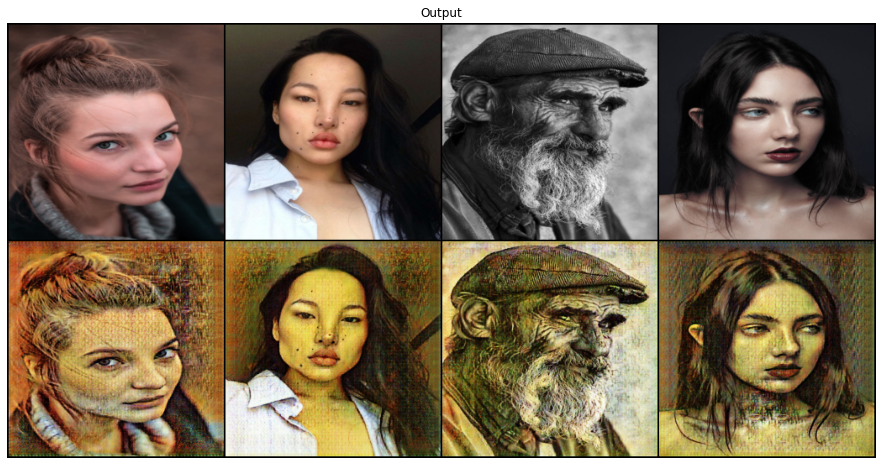

In [29]:
model_faces.display_output(idx=70, data_type="test", task_type="faces")

##Panoramas

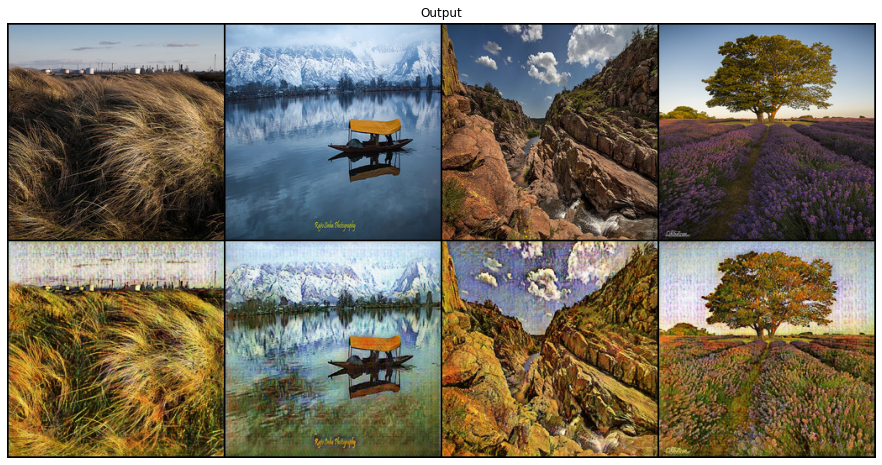

In [30]:
model_panoramas.display_output(idx=10, data_type="test", task_type="panoramas")

### Neural Model

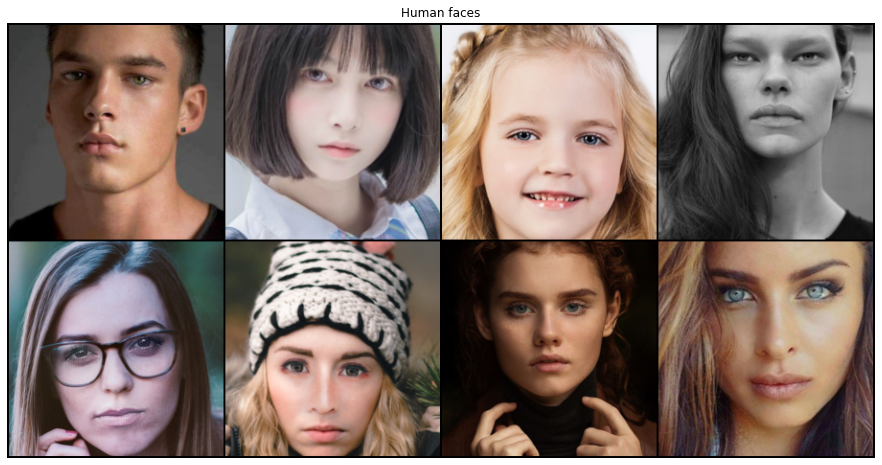

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


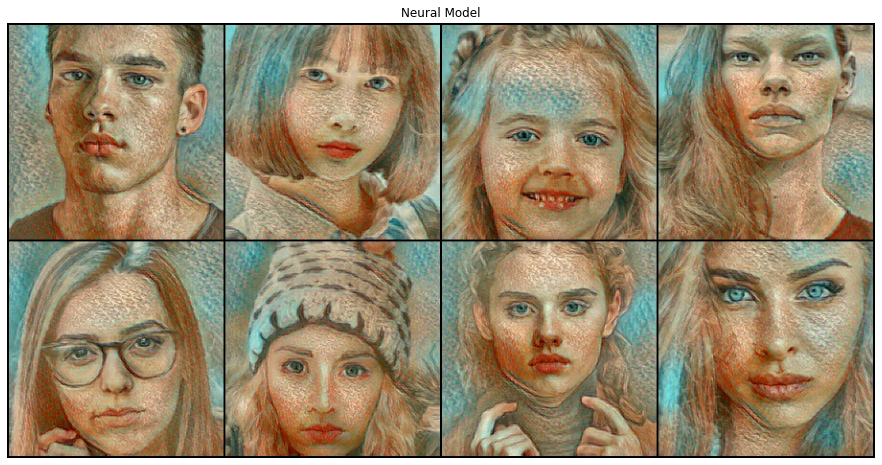

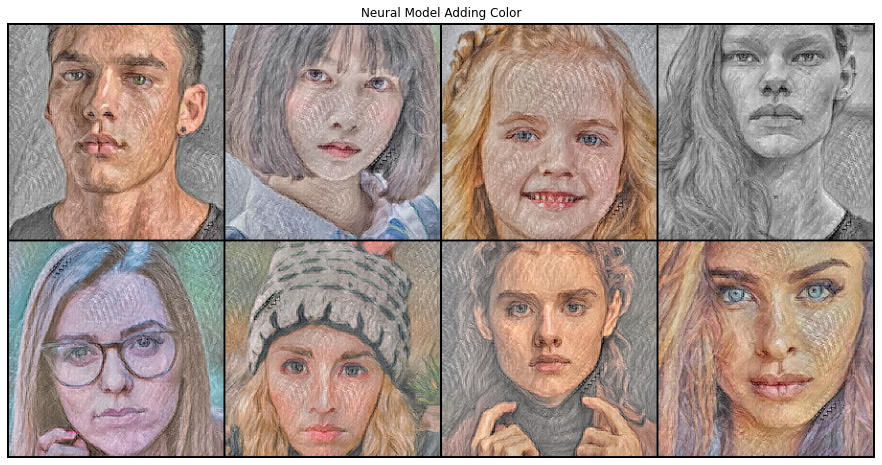

In [ ]:
batch, _ = next(iter(dataloader))
originals = (
    make_grid(invTrans(batch), nrow=4, padding=2).permute(1, 2, 0).detach().numpy()
)

fig = plt.figure(figsize=(18, 8), facecolor="w")
plt.imshow(originals)
plt.axis("off")
plt.title("Human faces")
plt.show()

neuralModel.eval()
batch = batch.to(device)
model1_results = invTrans(neuralModel(batch)).cpu()
model1_results = (
    make_grid(model1_results, nrow=4, padding=2).permute(1, 2, 0).detach().numpy()
)

fig = plt.figure(figsize=(18, 8), facecolor="w")
plt.imshow(model1_results)
plt.axis("off")
plt.title("Neural Model")
plt.show()

neuralModelGray.eval()
batch_gray = transformGray(batch)
model2_results = neuralModelGray(batch_gray)
model2_results = addColor(model2_results, batch).cpu()
model2_results = (
    make_grid(model2_results, nrow=4, padding=2).permute(1, 2, 0).detach().numpy()
)

fig = plt.figure(figsize=(18, 8), facecolor="w")
plt.imshow(model2_results)
plt.axis("off")
plt.title("Neural Model Adding Color")
plt.show()